In [1]:
import polars as pl
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [2]:

empty_val = set(pl.read_csv("extractions_STR_empty.validated.tsv.gz", 
                            has_header=False, new_columns=["#assembly_accession"])["#assembly_accession"].to_list())
len(empty_val)

19650

In [3]:
pattern = "STR"
COLS = ["#assembly_accession", "species_taxid", "partition", "organism_name", "domain", "kingdom", "phylum", "gc_percent", f"density_{pattern}"]

density_df = pd.read_table(f"../extractions_STR_MR/merged/{pattern}/extractions_{pattern}_density_merged.tsv.gz", usecols=COLS)
density_df_controls = pd.read_table(f"../extractions_STR_MR_shuffled/merged/{pattern}/extractions_{pattern}_density_merged.tsv.gz",
                                    usecols=COLS
                         )

In [4]:
density_df.head()

,#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR
0,GCF_000006785.2,.,1314,Streptococcus pyogenes M1 GAS,38.5,Bacteria,Bacillota,Bacillati,0.390
1,GCF_000006785.2,1,1314,Streptococcus pyogenes M1 GAS,38.5,Bacteria,Bacillota,Bacillati,0.011
2,GCF_000006785.2,2,1314,Streptococcus pyogenes M1 GAS,38.5,Bacteria,Bacillota,Bacillati,0.033
3,GCF_000006785.2,3,1314,Streptococcus pyogenes M1 GAS,38.5,Bacteria,Bacillota,Bacillati,0.170
4,GCF_000006785.2,4,1314,Streptococcus pyogenes M1 GAS,38.5,Bacteria,Bacillota,Bacillati,0.130


In [5]:
density_df = pl.from_pandas(density_df)
density_df_controls = pl.from_pandas(density_df_controls)

In [6]:
valid_accessions = set(density_df.filter(pl.col("partition") == ".")\
                     .filter(((pl.col("#assembly_accession").is_in(empty_val)) & (pl.col("density_STR") == 0)) | (pl.col("density_STR") > 0))["#assembly_accession"].to_list())

density_df = density_df.filter(pl.col("#assembly_accession").is_in(valid_accessions))
density_df.shape

(1178610, 9)

In [7]:
comparison_df = density_df\
                   .join( 
                       density_df_controls.select(["#assembly_accession", "partition", f"density_{pattern}"]),
                       on=["#assembly_accession", "partition"],
                       suffix="_control",
                       how="inner"
                   )\
                   .with_columns(
                       fold_enrichment=(pl.col(f"density_{pattern}") - pl.col(f"density_{pattern}_control")) / (pl.col(f"density_{pattern}") + pl.col(f"density_{pattern}_control") + 1e-10),
                   )
comparison_df

#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment
str,str,i64,str,f64,str,str,str,f64,f64,f64
"""GCA_000146305.1""",""".""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",2.349,0.779,0.501918
"""GCA_000146305.1""","""1""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.003,0.027,-0.8
"""GCA_000146305.1""","""2""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.334,0.434,-0.130208
"""GCA_000146305.1""","""3""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",1.354,0.064,0.909732
"""GCA_000146305.1""","""4""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.116,0.225,-0.319648
…,…,…,…,…,…,…,…,…,…,…
"""GCF_963676895.1""","""5""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.026,0.015,0.268293
"""GCF_963676895.1""","""6""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.073,0.0,1.0
"""GCF_963676895.1""","""7""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.099,0.0,1.0


In [8]:
comparison_df.filter(pl.col("kingdom") == "Protista", pl.col("partition") == ".").sort("fold_enrichment", descending=True).head(10).to_pandas()

,#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment
0,GCA_902825245.1,.,186038,Fragilariopsis kerguelensis,40.5,Eukaryota,Bacillariophyta,Protista,5.282,0.000,1.000000
1,GCA_034478905.1,.,1620387,Lotmaria passim,54.5,Eukaryota,Euglenozoa,Protista,43.606,0.563,0.974507
2,GCA_903995115.1,.,59799,Angomonas deanei,50.0,Eukaryota,Euglenozoa,Protista,27.657,0.387,0.972401
3,GCA_030078075.1,.,3034688,Crithidia sp. LVH-60A,57.0,Eukaryota,Euglenozoa,Protista,25.453,0.551,0.957622
4,GCF_000002725.2,.,5664,Leishmania major strain Friedlin,59.5,Eukaryota,Euglenozoa,Protista,23.929,0.567,0.953707
5,GCA_916722125.1,.,5664,Leishmania major strain Friedlin,59.5,Eukaryota,Euglenozoa,Protista,22.960,0.573,0.951302
6,GCA_917563935.1,.,5697,Trypanosoma evansi,46.5,Eukaryota,Euglenozoa,Protista,17.149,0.439,0.950080
7,GCA_003020905.1,.,5671,Leishmania infantum,59.5,Eukaryota,Euglenozoa,Protista,20.877,0.590,0.945032
8,GCA_024970365.1,.,5670,Leishmania guyanensis,58.0,Eukaryota,Euglenozoa,Protista,16.874,0.478,0.944905
9,GCA_003719575.1,.,5661,Leishmania donovani,60.0,Eukaryota,Euglenozoa,Protista,19.310,0.580,0.941679


In [9]:
comparison_df.head()

#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment
str,str,i64,str,f64,str,str,str,f64,f64,f64
"""GCA_000146305.1""",""".""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",2.349,0.779,0.501918
"""GCA_000146305.1""","""1""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.003,0.027,-0.8
"""GCA_000146305.1""","""2""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.334,0.434,-0.130208
"""GCA_000146305.1""","""3""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",1.354,0.064,0.909732
"""GCA_000146305.1""","""4""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.116,0.225,-0.319648


In [10]:
comparison_df.filter(pl.col("partition") == "6").to_pandas()["fold_enrichment"].round(5).value_counts()

fold_enrichment
 0.00000    56025
 1.00000    39595
 0.33333      545
-1.00000      460
 0.50000      364
            ...  
 0.13924        1
 0.92895        1
 0.99526        1
 0.98479        1
 0.99555        1
Name: count, Length: 3685, dtype: int64

In [11]:
comparison_df.filter(pl.col("partition") == "6", pl.col("domain") == "Bacteria").group_by(["#assembly_accession"]).agg(
    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
    pl.col("density_STR").min().alias("min_density"),
    pl.col("density_STR").max().alias("max_density"),
    pl.col("organism_name").first().alias("organism_name"),
).sort(["fold_enrichment"], descending=True).with_row_index().filter(pl.col("organism_name").str.contains("Burk")).to_pandas().head(40)

,index,#assembly_accession,fold_enrichment,min_density,max_density,organism_name
0,59,GCF_002860065.1,1.000000,0.880,0.880,Burkholderia pseudomallei
1,65,GCF_017378235.1,1.000000,0.776,0.776,Burkholderia pseudomallei
2,934,GCF_003546465.1,1.000000,0.198,0.198,Burkholderia cepacia ATCC 25416
3,1410,GCF_009578005.1,1.000000,0.165,0.165,Burkholderia glumae
4,3151,GCA_963666295.1,1.000000,0.102,0.102,Burkholderiaceae bacterium
5,15530,GCA_963675695.1,1.000000,0.033,0.033,Burkholderiaceae bacterium
6,26768,GCF_030297235.1,0.995590,0.905,0.905,Burkholderia pseudomallei
7,26769,GCF_002111105.1,0.995590,0.905,0.905,Burkholderia pseudomallei
8,26772,GCF_002111305.1,0.995068,0.809,0.809,Burkholderia pseudomallei
9,26783,GCF_030297195.1,0.993111,0.868,0.868,Burkholderia pseudomallei


In [12]:
comparison_df.filter(pl.col("partition") == ".").group_by("domain").agg(density_STR=pl.col("density_STR").mean(),
                                                                        density_STR_control=pl.col("density_STR_control").mean(),
).with_columns(
    fold_enrichment=(pl.col("density_STR") / pl.col("density_STR_control"))
)

domain,density_STR,density_STR_control,fold_enrichment
str,f64,f64,f64
"""Eukaryota""",9.057549,0.658114,13.762882
"""Bacteria""",1.077904,1.084715,0.99372
"""Archaea""",0.972066,0.944477,1.02921
"""Viruses""",1.776052,0.753705,2.356428


In [13]:
fe_enrichment = comparison_df.filter(pl.col('partition') == '.').with_columns(fe_enrichment=pl.col("density_STR") / pl.col("density_STR_control"))
domains = ["Eukaryota", "Viruses", "Bacteria", "Archaea"] 
from scipy.stats import mannwhitneyu, ttest_ind
for domain in domains:
    fe_enrichment_controls = fe_enrichment.filter(pl.col("domain") == domain)["density_STR_control"]
    fe_enrichment_domain = fe_enrichment.filter(pl.col("domain") == domain)["density_STR"]
    print(domain, ttest_ind(fe_enrichment_domain, fe_enrichment_controls, alternative='two-sided'))

Eukaryota TtestResult(statistic=np.float64(20.11209506201511), pvalue=np.float64(1.4570479412254395e-75), df=np.float64(978.0))
Viruses TtestResult(statistic=np.float64(87.10166560910268), pvalue=np.float64(0.0), df=np.float64(134972.0))
Bacteria TtestResult(statistic=np.float64(-0.753810848503784), pvalue=np.float64(0.4509646150447906), df=np.float64(98266.0))
Archaea TtestResult(statistic=np.float64(0.8052371110419463), pvalue=np.float64(0.4208223883580722), df=np.float64(1372.0))


In [14]:
comparison_df.filter(pl.col("partition") == ".").group_by("domain").agg(
    pl.col("fold_enrichment").mean()
).sort("fold_enrichment", descending=True).to_pandas()

,domain,fold_enrichment
0,Eukaryota,0.835907
1,Viruses,0.196456
2,Archaea,-0.030274
3,Bacteria,-0.031581


In [15]:
comparison_df.filter(pl.col("partition") == ".", 
                     pl.col("kingdom") == "Protista")\
                        .sort("fold_enrichment", descending=True).head(20).to_pandas()

,#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment
0,GCA_902825245.1,.,186038,Fragilariopsis kerguelensis,40.5,Eukaryota,Bacillariophyta,Protista,5.282,0.000,1.000000
1,GCA_034478905.1,.,1620387,Lotmaria passim,54.5,Eukaryota,Euglenozoa,Protista,43.606,0.563,0.974507
2,GCA_903995115.1,.,59799,Angomonas deanei,50.0,Eukaryota,Euglenozoa,Protista,27.657,0.387,0.972401
3,GCA_030078075.1,.,3034688,Crithidia sp. LVH-60A,57.0,Eukaryota,Euglenozoa,Protista,25.453,0.551,0.957622
4,GCF_000002725.2,.,5664,Leishmania major strain Friedlin,59.5,Eukaryota,Euglenozoa,Protista,23.929,0.567,0.953707
5,GCA_916722125.1,.,5664,Leishmania major strain Friedlin,59.5,Eukaryota,Euglenozoa,Protista,22.960,0.573,0.951302
6,GCA_917563935.1,.,5697,Trypanosoma evansi,46.5,Eukaryota,Euglenozoa,Protista,17.149,0.439,0.950080
7,GCA_003020905.1,.,5671,Leishmania infantum,59.5,Eukaryota,Euglenozoa,Protista,20.877,0.590,0.945032
8,GCA_024970365.1,.,5670,Leishmania guyanensis,58.0,Eukaryota,Euglenozoa,Protista,16.874,0.478,0.944905
9,GCA_003719575.1,.,5661,Leishmania donovani,60.0,Eukaryota,Euglenozoa,Protista,19.310,0.580,0.941679


In [65]:
# indir = Path("../data").resolve()
# comparison_df = pl.read_csv(indir / "group_comparison_STR_density_accessions.csv.gz").filter(pl.col("#assembly_accession").is_in(valid_accessions))
# comparison_df

In [66]:
# Viral Host Analysis

In [16]:
import pandas as pd
viruses_df = pd.read_table("../data/viruses.txt")
host_eukaryota = {'plants', 
                   'eukaryotic algae',
                   'invertebrates',
                   'fungi',
                  'land plants',
                  'human',
                  'protozoa',
                  'vertebrates'}

viruses = viruses_df.query("Host != '-'")
viruses.loc[:, "hostRe"] = viruses["Host"].apply(lambda y: 'Eukaryota' if all(i.strip() in host_eukaryota for i in y.split(',')) else y.capitalize())
viruses = viruses[viruses['hostRe'].isin({'Bacteria', 'Archaea', 'Eukaryota'})]\
                .drop_duplicates(subset=["#Organism/Name"])\
                .reset_index(drop=True)

df_viral_accessions = comparison_df\
                            .filter(pl.col("domain") == "Viruses",
                                    pl.col("partition") == ".")\
                            .join(
                                pl.from_pandas(viruses).select(["#Organism/Name", "hostRe"]).unique(["#Organism/Name", "hostRe"]),
                                left_on="organism_name", 
                                right_on="#Organism/Name", 
                                how="inner"
                            ).filter(~pl.col("hostRe").is_null())

df_viral_accessions

/tmp/ipykernel_110656/2144133695.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viruses.loc[:, "hostRe"] = viruses["Host"].apply(lambda y: 'Eukaryota' if all(i.strip() in host_eukaryota for i in y.split(',')) else y.capitalize())


#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment,hostRe
str,str,i64,str,f64,str,str,str,f64,f64,f64,str
"""GCA_002541945.1""",""".""",1986034,"""Enterobacteria phage ID11""",46.0,"""Viruses""","""Phixviricota""","""Sangervirae""",0.0,0.0,0.0,"""Bacteria"""
"""GCA_002542265.1""",""".""",1986034,"""Enterobacteria phage ID11""",46.0,"""Viruses""","""Phixviricota""","""Sangervirae""",0.0,0.0,0.0,"""Bacteria"""
"""GCA_002542635.1""",""".""",1986034,"""Enterobacteria phage ID11""",46.0,"""Viruses""","""Phixviricota""","""Sangervirae""",0.0,0.0,0.0,"""Bacteria"""
"""GCA_002542815.1""",""".""",1986034,"""Enterobacteria phage ID11""",46.0,"""Viruses""","""Phixviricota""","""Sangervirae""",0.0,1.793,-1.0,"""Bacteria"""
"""GCA_002543165.1""",""".""",1986034,"""Enterobacteria phage ID11""",46.0,"""Viruses""","""Phixviricota""","""Sangervirae""",0.0,0.0,0.0,"""Bacteria"""
…,…,…,…,…,…,…,…,…,…,…,…
"""GCF_004147265.1""",""".""",2955674,"""Mycobacterium phage Poenanya""",61.5,"""Viruses""","""Uroviricota""","""Heunggongvirae""",1.858,0.665,0.47285,"""Bacteria"""
"""GCF_004148565.1""",""".""",2955505,"""Mycobacterium phage NoodleTree""",64.5,"""Viruses""","""Uroviricota""","""Heunggongvirae""",1.741,1.072,0.237824,"""Bacteria"""
"""GCF_006964945.1""",""".""",3059972,"""Streptomyces phage Dubu""",68.5,"""Viruses""","""Uroviricota""","""Heunggongvirae""",1.239,1.315,-0.029757,"""Bacteria"""


In [17]:
df_viral_accessions.group_by("hostRe").agg(pl.col("density_STR").mean()).sort("density_STR", descending=True)

hostRe,density_STR
str,f64
"""Eukaryota""",2.375692
"""Archaea""",1.60694
"""Bacteria""",0.912527


In [18]:
domain_colors = {
                 'Viruses': '#229ad6',
                 'Eukaryota': '#edc41f',
                 'Archaea': '#b2b2ff',
                 'Bacteria': '#8eb812'
                }

### Statistical Evaluation of STR enrichment in viral hosts

In [19]:
import itertools 
hosts = ["Eukaryota", "Bacteria", "Archaea"]
hosts_paired = [c for c in itertools.product(hosts, repeat=2)]

for pair in hosts_paired:
    if pair[0] != pair[1]:
        STR_density_controls = df_viral_accessions.filter(pl.col("hostRe") == pair[0])["density_STR"]
        STR_density_domain = df_viral_accessions.filter(pl.col("hostRe") == pair[1])["density_STR"]
        print(pair, mannwhitneyu(STR_density_domain, STR_density_controls, alternative='two-sided'))

('Eukaryota', 'Bacteria') MannwhitneyuResult(statistic=np.float64(138657119.5), pvalue=np.float64(2.4056073567430543e-232))
('Eukaryota', 'Archaea') MannwhitneyuResult(statistic=np.float64(6252017.5), pvalue=np.float64(0.48604937677170135))
('Bacteria', 'Eukaryota') MannwhitneyuResult(statistic=np.float64(209435435.5), pvalue=np.float64(2.4056073567430543e-232))
('Bacteria', 'Archaea') MannwhitneyuResult(statistic=np.float64(3200221.5), pvalue=np.float64(9.953470753247253e-33))
('Archaea', 'Eukaryota') MannwhitneyuResult(statistic=np.float64(6499072.5), pvalue=np.float64(0.48604937677170135))
('Archaea', 'Bacteria') MannwhitneyuResult(statistic=np.float64(1569576.5), pvalue=np.float64(9.953470753247253e-33))


In [20]:
import pandas as pd
from bokeh.plotting import figure, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.io import reset_output, output_notebook
from bokeh.resources import INLINE

reset_output()
output_notebook(resources=INLINE)
############################################
from bokeh.io import export_svgs
from bokeh.models import ColumnDataSource, Whisker
from bokeh.plotting import figure, show
from bokeh.models import Legend, LegendItem


domain_colors = {
                 'Viruses': '#229ad6',
                 'Eukaryota': '#edc41f',
                 'Archaea': '#b2b2ff',
                 'Bacteria': '#8eb812'
                }

df = df_viral_accessions.group_by("species_taxid").agg(
    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
    pl.col("domain").first().alias("domain"),
    pl.col("hostRe").first().alias("hostRe"),
    pl.col("kingdom").first().alias("kingdom"),
    pl.col("phylum").first().alias("phylum"),
).to_pandas().copy()
group_col = "hostRe"
value_col = "fold_enrichment"
hosts = set(df["hostRe"])
cmap = {host: domain_colors[host] for host in hosts}
df.loc[:, "domain_color"] = df["hostRe"].map(cmap)

groups = sorted(df[group_col].dropna().unique())
qs = df.groupby(group_col)[value_col].quantile([0.25, 0.5, 0.75]).unstack().reset_index()
qs.columns = [group_col, "q1", "q2", "q3"]
df = df.merge(qs, on=group_col, how="left")

# Compute IQR whisker bounds
df["iqr"] = df["q3"] - df["q1"]
df["upper"] = df["q3"] + 1.5 * df["iqr"]
df["lower"] = df["q1"] - 1.5 * df["iqr"]

# Source for whiskers and boxes (aggregated)
box_stats = df[[group_col, "q1", "q2", "q3", "upper", "lower", "domain_color"]].drop_duplicates()
source = ColumnDataSource(box_stats)

# Outliers
outliers = df[~df[value_col].between(df["lower"], df["upper"])]
out_source = ColumnDataSource(outliers)

p = figure(x_range=["Eukaryota", "Archaea", "Bacteria"], 
           height=600, 
           width=900,
           title="",
           border_fill_color=None,
           output_backend="svg",
           y_axis_label="STR Enrichment")
whisker = Whisker(base=group_col, upper="upper", lower="lower", source=source)
whisker.upper_head.size = whisker.lower_head.size = 25
p.add_layout(whisker)

top_box = p.vbar(x=group_col, width=0.4, top="q3", bottom="q2", source=source, color="domain_color", line_color="black")
p.vbar(x=group_col, width=0.4, top="q2", bottom="q1", source=source, color="domain_color", line_color="black")

from bokeh.models import Span
hline = Span(location=0, dimension='width', line_color='black', line_width=2, line_dash='dashed')
p.add_layout(hline)

# legend = Legend(items=[
#   LegendItem(label=domain, renderers=[top_box], color=domain_colors[domain]) for domain in hosts
#])
# p.add_layout(legend, "right")

# Outlier dots
# p.scatter(x=group_col, y=value_col, source=out_source, size=6, color="black", alpha=0.3)
p.xgrid.grid_line_color = None
p.axis.major_label_text_font_size = "18pt"
p.axis.axis_label_text_font_size = "18pt"
p.title.text_font_size = "26pt"
p.title.align = "center"

p.y_range.end = 1.0
p.y_range.start = -1.0

p.xaxis.axis_label_text_font_size = "28pt"
p.yaxis.axis_label_text_font_size = "34pt"
p.xaxis.major_label_text_font_size = "32pt"
p.yaxis.major_label_text_font_size = "28pt"
p.title.text_font_style = "normal"
p.xaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font_style = "normal"

# Save SVGs
target = Path("STR_figures/simulation").resolve()
target.mkdir(exist_ok=True, parents=True)
show(p)
export_svgs(p, filename=target / "viral_host_enrichment_STR.svg")


Loading BokehJS ...

['/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation/viral_host_enrichment_STR.svg']

/tmp/ipykernel_31993/2949769616.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Eukaryota vs. Archaea: t-test independent samples with Benjamini-Hochberg correction, P_val:7.930e-02 t=1.755e+00
Archaea vs. Bacteria: t-test independent samples with Benjamini-Hochberg correction, P_val:4.061e-04 t=3.538e+00
Eukaryota vs. Bacteria: t-test independent samples with Benjamini-Hochberg correction, P_val:1.682e-203 t=3.089e+01


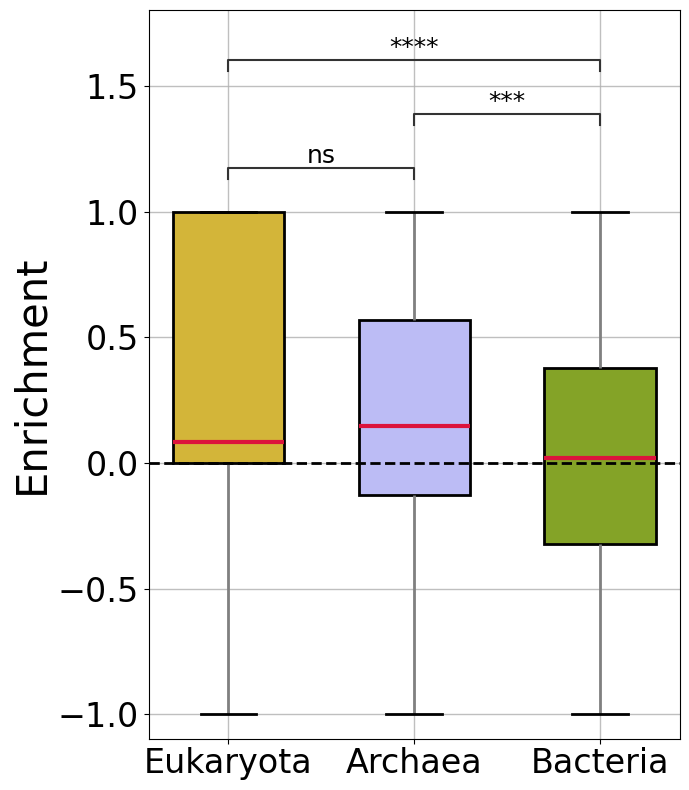

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import patches as mpatches
from statannotations.Annotator import Annotator
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42  # Embed fonts as TrueType (keeps text selectable/editable)
mpl.rcParams['ps.fonttype'] = 42  # For E

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7, 8))
df = df_viral_accessions.group_by("species_taxid").agg(
    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
    pl.col("domain").first().alias("domain"),
    pl.col("hostRe").first().alias("hostRe"),
    pl.col("kingdom").first().alias("kingdom"),
    pl.col("phylum").first().alias("phylum"),
).to_pandas().copy()
group_col = "hostRe"
value_col = "fold_enrichment"

hosts = set(df["hostRe"])
cmap = {host: domain_colors[host] for host in hosts}
df.loc[:, "domain_color"] = df["hostRe"].map(cmap)
order = ["Eukaryota", "Archaea", "Bacteria"]

sns.boxplot(data=df,
            x=group_col,
            y=value_col,
            palette=cmap,
            width=0.6,
            linewidth=1.5,
            # edgecolor="black",
            order=order,
            ax=ax,
            # saturation=0.8,
            # capsize=0.4,
            boxprops=dict(linewidth=2, edgecolor='black'),
            medianprops=dict(color='crimson', linewidth=3), 
            whiskerprops=dict(linewidth=2, color='gray'),
            capprops=dict(linewidth=2, color='black'),
            flierprops=dict(marker='o', color='orange', markersize=5)
           )
ax.grid(lw=1.0, alpha=0.8, zorder=0)
ax.set_axisbelow(True)
ax.tick_params(axis="x", rotation=0, pad=2)
ax.set_xlabel('')
ax.set_ylabel("Enrichment")
ax.yaxis.label.set_size(30)
ax.tick_params(axis="both", labelsize=24)
ax.tick_params(axis="x", 
               labelsize=24, 
               zorder=0)
ax.legend(handles=[], frameon=False)
pairs=[("Eukaryota", "Archaea"), ("Archaea", "Bacteria"), ("Eukaryota", "Bacteria")]
annotator = Annotator(ax, 
                      pairs, 
                      data=df,
                      x=group_col,
                      y=value_col,
                      order=order
                     )
annotator.configure(test='t-test_ind',  
                    comparisons_correction="fdr_bh",
                    text_format='star',
                    fontsize=18,
                    text_offset=-0.05,
                    loc='inside')
annotator.apply_and_annotate()
ax.axhline(0, color='black', zorder=5, linestyle='--', linewidth=2)
# for tick in ax.get_xticklabels():
#    tick.set_ha('right')
#    tick.set_x(tick.get_position()[0] - 0.006) 

target = Path("STR_figures/simulation").resolve()
plt.tight_layout()
fig.savefig(f"{target}/fold_enrichment_STR_viral_hosts.pdf", transparent=True, bbox_inches="tight")

#### KDE of Enrichment Values

In [21]:
comparison_df_avg = comparison_df.filter(pl.col("partition") == ".")\
                                .group_by(["species_taxid", "partition"])\
                                .agg(
                                    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
                                    pl.col("domain").first().alias("domain"),
                                    pl.col("kingdom").first().alias("kingdom"),
                                    pl.col("phylum").first().alias("phylum"),
                                    pl.col("density_STR").mean().alias("density_STR"),
                                    pl.col("density_STR_control").mean().alias("density_STR_control"),
                                )
comparison_df_avg.head()

species_taxid,partition,fold_enrichment,domain,kingdom,phylum,density_STR,density_STR_control
i64,str,f64,str,str,str,f64,f64
2955441,""".""",0.0,"""Viruses""","""Orthornavirae""","""Duplornaviricota""",0.0,0.0
2694599,""".""",0.610405,"""Viruses""","""Heunggongvirae""","""Uroviricota""",2.662,0.644
1213406,""".""",0.0,"""Viruses""","""Shotokuvirae""","""Cressdnaviricota""",0.0,0.0
2946113,""".""",-1.0,"""Viruses""","""Heunggongvirae""","""Uroviricota""",0.0,0.847
2734586,""".""",1.0,"""Viruses""",null,null,30.962,0.0


In [24]:
from bokeh.plotting import figure, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.io import reset_output, output_notebook
from bokeh.resources import INLINE
from bokeh.io import export_svgs
from scipy.stats import gaussian_kde
import numpy as np
from pathlib import Path

reset_output()
output_notebook(INLINE)
data = comparison_df_avg.filter(pl.col('partition') == '.')["fold_enrichment"].to_numpy()
# KDE
kde = gaussian_kde(data)
x_kde = np.linspace(min(data), max(data), 500)
y_kde = kde(x_kde)

# Histogram as frequencies
hist, edges = np.histogram(data, bins=30, density=True)

p = figure(
        width=600, 
        height=400, 
        title="",
        x_axis_label="STR Enrichment",
        y_axis_label="Density",
        border_fill_color=None,
        toolbar_location=None,
        output_backend="svg",
    )
    
p.quad(
        top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="dimgray",
          line_color="black", alpha=0.6
)
p.line(x_kde, y_kde, 
           line_color="dimgray", line_width=3, alpha=1.0,
)
p.line(x=[0.0, 0.0], y=[0, max(max(hist), max(y_kde))],
           line_color="black", line_dash="dashed", line_width=5)

p.title.text_font_size = "22pt"
p.title.align = "center"
p.y_range.start = 0
p.xaxis.axis_label_text_font_size = "30pt"
p.yaxis.axis_label_text_font_size = "30pt"
p.xaxis.major_label_text_font_size = "24pt"
p.yaxis.major_label_text_font_size = "24pt"
p.outline_line_color = "black"
p.outline_line_width = 2
p.title.text_font_style = "normal"
p.xaxis.axis_label_text_font_style = "normal"
p.yaxis.axis_label_text_font_style = "normal"

# Save SVGs
target.mkdir(exist_ok=True, parents=True)
show(p)
export_svgs(p, filename=target / f"domain_generic_histplot_enrichment_STR_shuffled.svg")

Loading BokehJS ...

['/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation/domain_generic_histplot_enrichment_STR_shuffled.svg']

In [193]:
target

PosixPath('/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation')

In [25]:
from bokeh.plotting import figure, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.io import reset_output, output_notebook
from bokeh.resources import INLINE
from bokeh.io import export_svgs
from scipy.stats import gaussian_kde
import numpy as np
from pathlib import Path

reset_output()
output_notebook(INLINE)
domain_colors = {
                'Viruses': '#229ad6',
                'Eukaryota': '#edc41f',
                'Archaea': '#b2b2ff',
                'Bacteria': '#b2d8b2'
}
domain_colors.update({"Bacteria": "#8eb812"})
superkingdoms = comparison_df_avg.filter(pl.col("partition") == ".")['domain'].unique().to_list()
plots = []

for sk in superkingdoms:
    data = comparison_df.filter(pl.col("partition") == ".")\
                .filter(pl.col('domain') == sk)['fold_enrichment'].to_numpy()
    
    # KDE
    kde = gaussian_kde(data)
    x_kde = np.linspace(min(data), max(data), 500)
    y_kde = kde(x_kde)

    # Histogram as frequencies
    hist, edges = np.histogram(data, bins=30, density=True)

    p = figure(
        width=600, height=400, 
        title=sk,
        border_fill_color=None,
        x_axis_label="STR Enrichment",
        y_axis_label="Density",
        toolbar_location=None,
        output_backend="svg",
    )
    
    # Histogram
    p.quad(
        top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color=domain_colors.get(sk, "gray"), line_color="black", alpha=0.6
    )

    # KDE Line
    p.line(x_kde, y_kde, 
           line_color=domain_colors.get(sk, "gray"), line_width=3, alpha=1.0,
    )

    # Vertical line at 0.0
    p.line(x=[0.0, 0.0], y=[0, max(max(hist), max(y_kde))],
           line_color="black", line_dash="dashed", line_width=5)

    # Styling
    p.title.text_font_size = "26pt"
    p.title.align = "center"
    p.xaxis.axis_label_text_font_size = "30pt"
    p.yaxis.axis_label_text_font_size = "30pt"
    p.xaxis.major_label_text_font_size = "24pt"
    p.yaxis.major_label_text_font_size = "24pt"
    p.outline_line_color = "black"
    p.y_range.start = 0
    p.outline_line_width = 2
    p.title.text_font_style = "normal"
    p.xaxis.axis_label_text_font_style = "normal"
    p.yaxis.axis_label_text_font_style = "normal"
    plots.append(p)
# Save SVGs
for i, p in enumerate(plots):
    show(p)
    domain = superkingdoms[i]
    export_svgs(p, filename=target / f"domain_{domain}_histplot_enrichment_STR_shuffled.svg")

Loading BokehJS ...

In [90]:
from scipy import stats 
import numpy as np 
from seaborn.algorithms import bootstrap
from seaborn.utils import ci
import pandas as pd 

def ci95(series):
    n = len(series)
    mean = series.mean()
    std = series.std(ddof=1)
    t = stats.t.ppf(0.975, n - 1)
    return t * (std / np.sqrt(n))

def seaborn_ci(series):
    boot_means = bootstrap(series, 
                           func=np.mean, 
                           n_boot=1000, 
                           seed=42)
    ci_bounds = ci(boot_means, 95)
    lower_ci, upper_ci = ci_bounds
    return pd.Series({"lower_ci": lower_ci, "upper_ci": upper_ci})

def calculate_average_density(df, on, value):
    if isinstance(df, pl.DataFrame):
        df = df.to_pandas()
    grouped = df.groupby(on)[value]

    mean = grouped.mean().reset_index(name='mean')
    ci_intervals = grouped.apply(seaborn_ci).reset_index()

    avg_value = pd.merge(mean, 
                     ci_intervals.query("level_1=='upper_ci'"), 
                     on=on, 
                     how='left')\
                    .merge(ci_intervals.query("level_1=='lower_ci'"), 
                           on=on,
                           how='left')\
                    .rename(columns={
                                     f'{value}_x': 'upper_ci', 
                                     f'{value}_y': 'lower_ci'
                                     })\
                    .drop(columns=["level_1_x", "level_1_y"])\
                    .sort_values('mean', ascending=False)
    return avg_value

comparison_df_all = comparison_df_avg.filter(pl.col("partition") == ".")
avg_value = calculate_average_density(comparison_df_all, on="domain", value=f"density_{pattern}")
avg_value_control = calculate_average_density(comparison_df_all, on="domain", value=f"density_{pattern}_control")
avg_value = avg_value.merge(
    avg_value_control,
    how="left",
    on="domain",
    suffixes=("", "_control")
)

avg_value

,domain,mean,upper_ci,lower_ci,mean_control,upper_ci_control,lower_ci_control
0,Eukaryota,9.605073,10.721608,8.546853,0.675372,0.757290,0.603655
1,Viruses,1.512275,1.542681,1.482519,0.737100,0.748185,0.727140
2,Bacteria,1.214119,1.242072,1.186359,1.177469,1.194445,1.159277
3,Archaea,1.017964,1.086101,0.952694,0.981743,1.029169,0.933084


In [178]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Whisker, Legend, LegendItem
from bokeh.transform import dodge
from scipy import stats
import numpy as np

source = ColumnDataSource(avg_value)
domains_sorted = ["Eukaryota", "Viruses", "Bacteria", "Archaea"]
bar_fig = figure(
    x_range=domains_sorted, 
    height=600,
    width=800, 
    border_fill_color=None,
    title="",
    output_backend="svg",
    toolbar_location=None, 
    tools=""
)

bar_width = 0.35
expected_color = "#e84d60"
observed_color = "#3c4cba"

# Observed bars (dodge -0.2)
obs_renderer = bar_fig.vbar(
    x=dodge('domain', -bar_width/2, range=bar_fig.x_range),
    top='mean', 
    width=bar_width,
    color=observed_color,
    line_color="black", 
    line_width=2,
    source=source,
    legend_label="Observed"
)

# Expected bars (dodge +0.2)
exp_renderer = bar_fig.vbar(
    x=dodge('domain', +bar_width/2, range=bar_fig.x_range),
    top='mean_control', 
    width=bar_width,
    color=expected_color,
    line_color="black", 
    line_width=2,
    source=source,
    legend_label="Expected"
)

# Custom legend
legend = Legend(
    items=[
        LegendItem(label="Observed STR Density", renderers=[obs_renderer]),
        LegendItem(label="Expected STR Density", renderers=[exp_renderer]),
    ],
    orientation="vertical",  # now this matters
    location="top_left"  # or any valid position inside the plot
)
# bar_fig.add_layout(legend, 'center')
# legend.spacing = 
# legend.orientation = "vertical"
# legend.location = "bottom_center" 


# Error bars for observed
error = Whisker(source=source, 
                           base=dodge('domain', -bar_width/2, range=bar_fig.x_range), 
                           level="overlay",
                          upper='upper_ci', 
                          lower='lower_ci')
error.line_width = 2.0
error.upper_head.size = 20
error.lower_head.size = 20
bar_fig.add_layout(error)

# Error bars for expected

error_control = Whisker(source=source, 
                        base=dodge('domain', +bar_width/2, range=bar_fig.x_range), 
                        level="overlay",
                          upper='upper_ci_control', 
                          lower='lower_ci_control')
error_control.line_width = 2.0
error_control.upper_head.size = 20
error_control.lower_head.size = 20
bar_fig.add_layout(error_control)

# Styling
bar_fig.xgrid.grid_line_color = None
bar_fig.y_range.start = 0
bar_fig.y_range.end = max(avg_value['upper_ci'].max(), avg_value['upper_ci_control'].max()) * 1.2
bar_fig.xaxis.axis_label = ""
bar_fig.yaxis.axis_label = "STR Density per kB"

# Font sizes and styles (normal = no italics)
bar_fig.title.text_font_size = "28pt"
bar_fig.title.text_font_style = "normal"
bar_fig.title.align = "center"

bar_fig.xaxis.axis_label_text_font_size = "30pt"
bar_fig.xaxis.axis_label_text_font_style = "normal"
bar_fig.yaxis.axis_label_text_font_size = "32pt"
bar_fig.yaxis.axis_label_text_font_style = "normal"

bar_fig.xaxis.major_label_text_font_size = "32pt"
bar_fig.xaxis.major_label_text_font_style = "normal"
bar_fig.yaxis.major_label_text_font_size = "28pt"
bar_fig.yaxis.major_label_text_font_style = "normal"

bar_fig.legend.location = "top_center"
bar_fig.legend.orientation = "horizontal"
bar_fig.legend.label_text_font_size = "20pt"
bar_fig.legend.glyph_height = 25
bar_fig.legend.glyph_width = 50
bar_fig.legend.spacing = 15

show(bar_fig)
export_svgs(bar_fig, filename=target / "expected_vs_observed_STR_density_domains.svg")

['/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation/expected_vs_observed_STR_density_domains.svg']

# Repeating Unit Comparison

In [91]:
indir = Path("../data").resolve()
# comparison_df = pl.read_csv(indir / "group_comparison_STR_density_accessions.sru.csv.gz")

comparison_df_partition = comparison_df_avg.filter(pl.col("partition") != ".")
viral_kingdoms = set(comparison_df.filter(pl.col("domain") == "Viruses")["kingdom"])
comparison_df_partition = comparison_df.with_columns(kingdom_n=pl.col("kingdom").map_elements(lambda x: "Viruses" if x in viral_kingdoms else x, return_dtype=pl.Utf8))
comparison_df_partition

#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment,kingdom_n
str,str,i64,str,f64,str,str,str,f64,f64,f64,str
"""GCA_000146305.1""",""".""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",2.349,0.779,0.501918,"""Pseudomonadati"""
"""GCA_000146305.1""","""1""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.003,0.027,-0.8,"""Pseudomonadati"""
"""GCA_000146305.1""","""2""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.334,0.434,-0.130208,"""Pseudomonadati"""
"""GCA_000146305.1""","""3""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",1.354,0.064,0.909732,"""Pseudomonadati"""
"""GCA_000146305.1""","""4""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.116,0.225,-0.319648,"""Pseudomonadati"""
…,…,…,…,…,…,…,…,…,…,…,…
"""GCF_963676895.1""","""5""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.026,0.015,0.268293,"""Pseudomonadati"""
"""GCF_963676895.1""","""6""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.073,0.0,1.0,"""Pseudomonadati"""
"""GCF_963676895.1""","""7""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.099,0.0,1.0,"""Pseudomonadati"""


In [92]:
comparison_df_avg.filter(pl.col("partition") != ".").head()

species_taxid,partition,fold_enrichment,domain,kingdom,phylum,density_STR,density_STR_control
i64,str,f64,str,str,str,f64,f64


In [93]:
domains = ["Eukaryota", "Viruses", "Archaea", "Bacteria"]

comparison_df_sru_avg_list = []
comparison_df_avg_partition = comparison_df\
                                .group_by(["species_taxid", "partition"])\
                                .agg(
                                    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
                                    pl.col("domain").first().alias("domain"),
                                    pl.col("kingdom").first().alias("kingdom"),
                                    pl.col("phylum").first().alias("phylum"),
                                    pl.col("density_STR").mean().alias("density_STR"),
                                    pl.col("density_STR_control").mean().alias("density_STR_control"),
                                )

for domain in domains:
    comparison_df_sru_avg = calculate_average_density(comparison_df_avg_partition.filter(pl.col("partition") != ".",
                                                                           pl.col("domain") == domain), 
                                                      on="partition", 
                                                      value=f"density_{pattern}")
    comparison_df_sru_avg.loc[:, "domain"] = domain
    comparison_df_sru_avg_list.append(comparison_df_sru_avg)

comparison_df_sru_avg_list = pd.concat(comparison_df_sru_avg_list)
comparison_df_sru_avg_list

,partition,mean,upper_ci,lower_ci,domain
0,1,2.246994,2.682542,1.885097,Eukaryota
2,3,2.173251,2.477025,1.902143,Eukaryota
1,2,1.958629,2.421717,1.604310,Eukaryota
3,4,1.240735,1.365854,1.122740,Eukaryota
5,6,0.747245,0.823485,0.671366,Eukaryota
4,5,0.714684,0.896618,0.583913,Eukaryota
8,9,0.221185,0.385619,0.132027,Eukaryota
6,7,0.211835,0.248908,0.180480,Eukaryota
7,8,0.123836,0.150723,0.101715,Eukaryota
2,3,0.503301,0.514349,0.492535,Viruses


In [50]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Whisker, Legend, LegendItem
from bokeh.transform import dodge

sru_sorted = list(map(str, range(1, 7)))
# comparison_df_sru_avg_list = comparison_df_sru_avg_list.query("partition < 7")
comparison_df_sru_avg_list.loc[:, "partition"] = comparison_df_sru_avg_list["partition"].astype(str)
domain_colors = {
                'Viruses': '#229ad6',
                'Eukaryota': '#edc41f',
                'Archaea': '#b2b2ff',
                'Bacteria': '#b2d8b2'
}
domain_colors.update({"Bacteria": "#8eb812"})
bar_fig = figure(
    x_range=sru_sorted,
    height=600,
    width=800,
    border_fill_color=None,
    output_backend="svg",
    toolbar_location=None,
    tools=""
)

bar_width = 0.2
domains = ["Eukaryota", "Viruses", "Bacteria", "Archaea"]
num_domains = len(domains)
legend_items = []

for i, domain in enumerate(domains):
    color = domain_colors[domain]
    # Subset data for partition
    df_domain = comparison_df_sru_avg_list.query("domain == @domain")
    source = ColumnDataSource(df_domain)
    # Dodge offset for group position
    offset = -bar_width * (num_domains - 1) / 2 + i * bar_width
    # Add bars
    renderer = bar_fig.vbar(
        x=dodge("partition", offset, range=bar_fig.x_range),
        top="mean",
        width=bar_width,
        color=color,
        line_color="black",
        line_width=1.5,
        source=source,
        # legend_label=f""
    )
    # Optional: Add error bars
    whisker = Whisker(
        source=source,
        base=dodge("partition", offset, range=bar_fig.x_range),
        upper="upper_ci",
        lower="lower_ci",
        level="overlay"
    )
    whisker.upper_head.size = 10
    whisker.lower_head.size = 10
    whisker.line_width = 2
    bar_fig.add_layout(whisker)

# Styling
bar_fig.y_range.start = 0
bar_fig.y_range.end = comparison_df_sru_avg_list["upper_ci"].max() * 1.1
bar_fig.xgrid.grid_line_color = None
bar_fig.xaxis.major_label_text_font_size = "18pt"
bar_fig.yaxis.major_label_text_font_size = "18pt"
bar_fig.yaxis.axis_label = "STR Density per kB"
bar_fig.xaxis.axis_label = "Repeating Unit Length (bp)"
bar_fig.yaxis.axis_label_text_font_size = "22pt"
bar_fig.xaxis.axis_label_text_font_size = "22pt"
# bar_fig.legend.label_text_font_size = "12pt"
# bar_fig.legend.location = "top_left"
# bar_fig.legend.orientation = "vertical"
bar_fig.xaxis.axis_label_text_font_style = "normal"
bar_fig.yaxis.axis_label_text_font_style = "normal"
bar_fig.xaxis.major_label_text_font_style = "normal"
bar_fig.yaxis.major_label_text_font_style = "normal"

show(bar_fig)
target = Path("STR_figures/simulation").resolve()
target.mkdir(exist_ok=True)
export_svgs(bar_fig, filename=target / f"STR_density_domains_of_life.svg")

['/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation/STR_density_domains_of_life.svg']

In [51]:
comparison_df["kingdom"].unique()

kingdom
str
"""Methanobacteriati"""
"""Thermotogati"""
"""Pararnavirae"""
"""Orthornavirae"""
"""Sangervirae"""
…
"""Metazoa"""
null
"""Zilligvirae"""


In [94]:
comparison_df["kingdom"].unique()
comparison_df_filtered = comparison_df.with_columns(
                    kingdom_n=pl.struct(["kingdom", "domain"]).map_elements(
                                lambda x: "Viruses" if x["domain"] == "Viruses" else x["kingdom"],
                                return_dtype=str
                    )
            ).filter(~pl.col("kingdom_n").is_null())

comparison_df_filtered

#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment,kingdom_n
str,str,i64,str,f64,str,str,str,f64,f64,f64,str
"""GCA_000146305.1""",""".""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",2.349,0.779,0.501918,"""Pseudomonadati"""
"""GCA_000146305.1""","""1""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.003,0.027,-0.8,"""Pseudomonadati"""
"""GCA_000146305.1""","""2""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.334,0.434,-0.130208,"""Pseudomonadati"""
"""GCA_000146305.1""","""3""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",1.354,0.064,0.909732,"""Pseudomonadati"""
"""GCA_000146305.1""","""4""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.116,0.225,-0.319648,"""Pseudomonadati"""
…,…,…,…,…,…,…,…,…,…,…,…
"""GCF_963676895.1""","""5""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.026,0.015,0.268293,"""Pseudomonadati"""
"""GCF_963676895.1""","""6""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.073,0.0,1.0,"""Pseudomonadati"""
"""GCF_963676895.1""","""7""",173975,"""uncultured Shewanella sp.""",46.0,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.099,0.0,1.0,"""Pseudomonadati"""


In [95]:
list(comparison_df_filtered["kingdom_n"].unique())

['Metazoa',
 'Fungi',
 'Thermotogati',
 'Thermoproteati',
 'Plantae',
 'Bacillati',
 'Viruses',
 'Methanobacteriati',
 'Fusobacteriati',
 'Pseudomonadati',
 'Promethearchaeati',
 'Nanobdellati',
 'Protista']

In [96]:
from tqdm import tqdm

kingdoms = comparison_df_filtered["kingdom_n"].unique()
comparison_df_sru_avg_list = []
kingdom_to_domain = dict(zip(comparison_df_filtered["kingdom_n"], comparison_df_filtered["domain"]))

comparison_df_filtered = comparison_df_filtered.group_by(["species_taxid", "partition"])\
                                .agg(
                                    pl.col("fold_enrichment").mean().alias("fold_enrichment"),
                                    pl.col("domain").first().alias("domain"),
                                    pl.col("kingdom_n").first().alias("kingdom_n"),
                                    pl.col("kingdom").first().alias("kingdom"),
                                    pl.col("phylum").first().alias("phylum"),
                                    pl.col(f"density_{pattern}").mean().alias(f"density_{pattern}"),
                                    pl.col(f"density_{pattern}_control").mean().alias(f"density_{pattern}_control"),
                                )
for kingdom in tqdm(kingdoms):
    comparison_df_sru_avg = calculate_average_density(comparison_df_filtered.filter(pl.col("kingdom_n") == kingdom,
                                                                           pl.col("partition") != "."), 
                                                      on="partition", 
                                                      value=f"density_{pattern}")
    comparison_df_sru_avg.loc[:, "kingdom"] = kingdom
    comparison_df_sru_avg.loc[:, "domain"] = kingdom_to_domain[kingdom]
    comparison_df_sru_avg_list.append(comparison_df_sru_avg)

comparison_df_sru_avg_list = pd.concat(comparison_df_sru_avg_list)
comparison_df_sru_avg_list

100%|██████████| 13/13 [00:02<00:00,  6.04it/s]


,partition,mean,upper_ci,lower_ci,kingdom,domain
2,3,0.498912,0.540982,0.457224,Methanobacteriati,Archaea
3,4,0.258905,0.272500,0.246588,Methanobacteriati,Archaea
1,2,0.099495,0.107697,0.091918,Methanobacteriati,Archaea
5,6,0.099084,0.115505,0.085444,Methanobacteriati,Archaea
4,5,0.038674,0.043946,0.033872,Methanobacteriati,Archaea
...,...,...,...,...,...,...
4,5,0.088800,0.150000,0.048000,Promethearchaeati,Archaea
5,6,0.087800,0.147400,0.033800,Promethearchaeati,Archaea
8,9,0.030600,0.049400,0.011785,Promethearchaeati,Archaea
7,8,0.011600,0.021400,0.002600,Promethearchaeati,Archaea


In [97]:
kingdom_color_palette = {
                     'Viruses':'#229ad6',
                     'Bacteria': '#0fbf2d',
                     'Archaea': '#b2b2ff',
                     'Fungi': '#4d325e',
                     'Plantae': '#b50996',
                     'Eubacteria': '#0fbf2d',
                     'Metazoa': '#9bba2d',
                     'Protista': '#c78f5b',
                     'Thermoproteati': '#380e8c',
                      'Promethearchaeati': '#672fd6',
                      'Nanobdellati': '#8154eb',
                      'Methanobacteriati': '#1fc46a',
                      'Fusobacteriati': '#94cc2d',
                      'Pseudomonadati': '#b2d8b2',
                      'Bacillati': '#bbd61e',
                     'Thermotogati': '#7b7bed'
                     }

In [60]:
sru_sorted = list(map(str, range(1, 7)))
# comparison_df_sru_avg_list = comparison_df_sru_avg_list.query("partition < 7")
comparison_df_sru_avg_list.loc[:, "partition"] = comparison_df_sru_avg_list["partition"].astype(str)

bar_fig = figure(
    x_range=sru_sorted,
    height=600,
    width=900,
    border_fill_color=None,
    output_backend="svg",
    toolbar_location=None,
    tools=""
)

bar_width = 0.2
eukaryotic_kingdoms = comparison_df_sru_avg_list.query("domain == 'Eukaryota'")
kingdoms = eukaryotic_kingdoms["kingdom"].unique().tolist()
num_kingdoms = len(kingdoms)
legend_items = []

for i, kingdom in enumerate(kingdoms):
    color = kingdom_color_palette[kingdom]
    # Subset data for partition
    df_kingdom = eukaryotic_kingdoms.query("kingdom == @kingdom")
    source = ColumnDataSource(df_kingdom)
    # Dodge offset for group position
    offset = -bar_width * (num_kingdoms - 1) / 2 + i * bar_width
    # Add bars
    renderer = bar_fig.vbar(
        x=dodge("partition", offset, range=bar_fig.x_range),
        top="mean",
        width=bar_width,
        color=color,
        line_color="black",
        line_width=1.5,
        source=source,
        # legend_label=f""
    )
    # Optional: Add error bars
    whisker = Whisker(
        source=source,
        base=dodge("partition", offset, range=bar_fig.x_range),
        upper="upper_ci",
        lower="lower_ci",
        level="overlay"
    )
    whisker.upper_head.size = 20
    whisker.lower_head.size = 20
    whisker.line_width = 1
    bar_fig.add_layout(whisker)

# Styling
bar_fig.y_range.start = 0
bar_fig.y_range.end = comparison_df_sru_avg_list["upper_ci"].max() * 1.1
bar_fig.xgrid.grid_line_color = None
bar_fig.yaxis.axis_label = "STR Density per kB"
bar_fig.xaxis.axis_label = "Repeating Unit Length (bp)"
bar_fig.xaxis.major_label_text_font_size = "18pt"
bar_fig.yaxis.major_label_text_font_size = "18pt"
bar_fig.yaxis.axis_label_text_font_size = "22pt"
bar_fig.xaxis.axis_label_text_font_size = "22pt"
# bar_fig.legend.label_text_font_size = "12pt"
# bar_fig.legend.location = "top_left"
# bar_fig.legend.orientation = "vertical"
bar_fig.xaxis.axis_label_text_font_style = "normal"
bar_fig.yaxis.axis_label_text_font_style = "normal"
bar_fig.xaxis.major_label_text_font_style = "normal"
bar_fig.yaxis.major_label_text_font_style = "normal"

show(bar_fig)
target = Path("STR_figures/simulation").resolve()
target.mkdir(exist_ok=True)
export_svgs(bar_fig, filename=target / f"STR_density_eukaryotic_kingdoms.svg")

['/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation/STR_density_eukaryotic_kingdoms.svg']

In [184]:
comparison_df_melted  = comparison_df\
        .filter(pl.col("partition") == ".", ~pl.col("kingdom").is_null())\
        .group_by("species_taxid")\
        .agg(
            pl.col("density_STR").mean().alias("density_STR"),
            pl.col("density_STR_control").mean().alias("density_STR_control"),
            pl.col("kingdom").first().alias("kingdom"),
            pl.col("domain").first().alias("domain"),
            pl.col("phylum").first().alias("phylum"),
            pl.col("organism_name").first().alias("organism_name"),
            pl.col("gc_percent").mean().alias("gc_percent"),
            pl.col("partition").first().alias("partition"),
        )\
    .melt(
        id_vars=["species_taxid", "partition", "organism_name", "domain", "kingdom", "phylum", "gc_percent"],
        value_vars=["density_STR", "density_STR_control"],
        variable_name="STR_density"
    )\
        .with_columns(
            pl.col("STR_density").replace("density_STR", "STR").replace("density_STR_control", "Control")
        )

order = comparison_df_melted.filter(pl.col("STR_density") == "STR").group_by("kingdom").agg(pl.col("value").mean().alias("density")).sort("density", descending=True).select("kingdom").to_series().to_list()
comparison_df_melted

/tmp/ipykernel_31993/3408063663.py:1: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`
  comparison_df_melted  = comparison_df\


species_taxid,partition,organism_name,domain,kingdom,phylum,gc_percent,STR_density,value
i64,str,str,str,str,str,f64,str,f64
2049305,""".""","""Changchengzhania lutea""","""Bacteria""","""Pseudomonadati""","""Bacteroidota""",35.0,"""STR""",0.967
2843782,""".""","""Bacillus phage vB_Bpu_PumA2""","""Viruses""","""Heunggongvirae""","""Uroviricota""",36.0,"""STR""",0.0
12198,""".""","""Clover yellow vein virus""","""Viruses""","""Orthornavirae""","""Pisuviricota""",41.0,"""STR""",1.565
93466,""".""","""Fervidobacterium pennivorans D…","""Bacteria""","""Thermotogati""","""Thermotogota""",39.0,"""STR""",0.475667
1967781,""".""","""Rhizobium esperanzae""","""Bacteria""","""Pseudomonadati""","""Pseudomonadota""",61.0,"""STR""",0.966
…,…,…,…,…,…,…,…,…
3065298,""".""","""Salinicola sp. LHM""","""Bacteria""","""Pseudomonadati""","""Pseudomonadota""",62.5,"""Control""",0.92
2897772,""".""","""Thauera sp. WB-2""","""Bacteria""","""Pseudomonadati""","""Pseudomonadota""",66.0,"""Control""",1.507
2846655,""".""","""ssRNA phage Zoerhiza.3_7""","""Viruses""","""Orthornavirae""","""Lenarviricota""",49.0,"""Control""",0.0


In [185]:
comparison_df_melted.filter(pl.col("kingdom") == "Thermoproteati")

species_taxid,partition,organism_name,domain,kingdom,phylum,gc_percent,STR_density,value
i64,str,str,str,str,str,f64,str,f64
2058097,""".""","""Candidatus Nitrosocaldus cavas…","""Archaea""","""Thermoproteati""","""Nitrososphaerota""",41.5,"""STR""",3.197
1577685,""".""","""Acidilobus sp. 7A""","""Archaea""","""Thermoproteati""","""Thermoproteota""",58.0,"""STR""",0.288
13773,""".""","""Pyrobaculum aerophilum str. IM…","""Archaea""","""Thermoproteati""","""Thermoproteota""",51.5,"""STR""",0.559
3060460,""".""","""Pyrofollis japonicus""","""Archaea""","""Thermoproteati""","""Thermoproteota""",49.5,"""STR""",0.28
2775498,""".""","""Metallosphaera javensis (ex Sa…","""Archaea""","""Thermoproteati""","""Thermoproteota""",47.0,"""STR""",0.318
…,…,…,…,…,…,…,…,…
1294262,""".""","""Sulfuracidifex tepidarius""","""Archaea""","""Thermoproteati""","""Thermoproteota""",42.5,"""Control""",0.5245
47303,""".""","""Sulfuracidifex metallicus DSM …","""Archaea""","""Thermoproteati""","""Thermoproteota""",38.5,"""Control""",0.62
1353260,""".""","""Candidatus Nitrosocosmicus ole…","""Archaea""","""Thermoproteati""","""Nitrososphaerota""",34.0,"""Control""",1.049


In [210]:
comparison_df_melted.group_by(["kingdom", "STR_density"]).agg(pl.col("value").mean()).filter(pl.col("kingdom") == "Fusobacteriati")

kingdom,STR_density,value
str,str,f64
"""Fusobacteriati""","""Control""",2.298148
"""Fusobacteriati""","""STR""",1.132963


In [212]:
1.13 / 2.3

0.49130434782608695

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Heunggongvirae_STR vs. Heunggongvirae_Control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9.813e-57 U_stat=1.538e+08
Bacillati_STR vs. Bacillati_Control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.651e-05 U_stat=8.823e+06
Pararnavirae_STR vs. Pararnavirae_Control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.577e-11 U_stat=4.667e+04
Fusobacteriati_STR vs. Fusobacteriati_Control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.205e-10 U_stat=8.400e+01
Orthornavirae_STR vs. Orthornavirae_Control: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.644e-136 U_stat=2.816e+07
Methanobacteriati_STR vs. Methanobacteriati_Control: Mann-

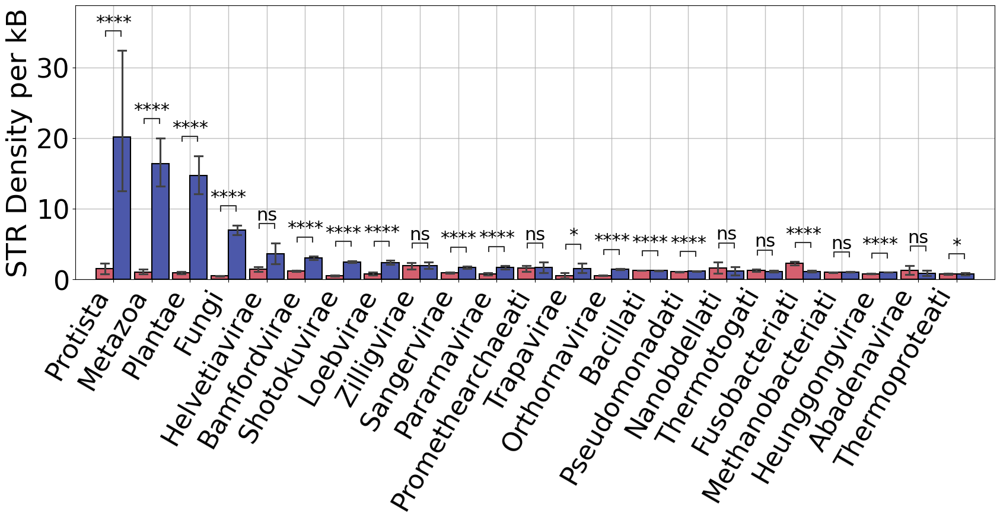

In [195]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import patches as mpatches
from statannotations.Annotator import Annotator
import matplotlib as mp

mpl.rcParams['pdf.fonttype'] = 42 
mpl.rcParams['ps.fonttype'] = 42

# Specify Mode
mode = "STR"
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 6))
expected_color = "#e84d60"
observed_color = "#3c4cba"
palette = {
           "Control": expected_color,
           mode: observed_color
          }

sns.barplot(data=comparison_df_melted.to_pandas(),
            x="kingdom",
            y="value",
            hue=f"{mode}_density",
            palette=palette,
            width=0.9,
            linewidth=1.5,
            edgecolor="black",
            # showfliers=False,
            order=order,
            hue_order=["Control", mode],
            ax=ax,
            capsize=0.4,
            # boxprops=dict(linewidth=2, edgecolor='black'),
            # medianprops=dict(color='crimson', linewidth=3), 
            # whiskerprops=dict(linewidth=2, color='gray'),
            # capprops=dict(linewidth=2, color='black'),
            # saturation=0.8,
            # flierprops=dict(marker='o', color='orange', markersize=5)
           )
ax.grid(lw=1.0, alpha=0.8, zorder=0)
ax.set_axisbelow(True)
ax.tick_params(axis="x", rotation=60, pad=2)
ax.set_xlabel('')
ax.set_ylabel(f"{mode} Density per kB")
ax.yaxis.label.set_size(34)
ax.tick_params(axis="both", 
               labelsize=32, 
               zorder=0)
ax.tick_params(axis="x", labelsize=32, 
               zorder=0)
ax.legend(handles=[], frameon=False)
ranks = comparison_df_melted["kingdom"].unique()
pairs=[((q, "Control"), (q, mode)) for q in ranks]

annotator = Annotator(ax, 
                      pairs, 
                      data=comparison_df_melted.to_pandas(), 
                      x="kingdom", 
                      hue=f"{mode}_density",
                      y="value", 
                      order=order
                     )
annotator.configure(test='Mann-Whitney',  
                    comparisons_correction="fdr_bh",
                    text_format='star',
                    fontsize=22,
                    text_offset=-0.05,
                    loc='inside')
annotator.apply_and_annotate()
for tick in ax.get_xticklabels():
    tick.set_ha('right')
    # tick.set_x(tick.get_position()[0] - 0.006) 
x0, x1 = ax.get_xlim()
ax.set_xlim(x0 + 0.6, x1 - 0.6) 
fig.savefig(f"{target}/{mode}_density_kingdom_vs_controls_boxplot.pdf", transparent=True, bbox_inches="tight")

In [115]:
comparison_df_melted  = comparison_df\
        .filter(pl.col("partition") != ".")\
        .group_by(["species_taxid", "partition"], maintain_order=True)\
        .agg(
            pl.col("density_STR").mean().alias("density_STR"),
            pl.col("density_STR_control").mean().alias("density_STR_control"),
            pl.col("kingdom").first().alias("kingdom"),
            pl.col("domain").first().alias("domain"),
            pl.col("phylum").first().alias("phylum"),
            pl.col("organism_name").first().alias("organism_name"),
            pl.col("gc_percent").mean().alias("gc_percent"),
        )\
    .melt(
        id_vars=["species_taxid", "partition", "organism_name", "domain", "kingdom", "phylum", "gc_percent"],
        value_vars=["density_STR", "density_STR_control"],
        variable_name="STR_density"
    )\
        .with_columns(
            pl.col("STR_density").replace("density_STR", "STR").replace("density_STR_control", "Control")
        )\
        .with_columns(
            partition=pl.col("partition").cast(pl.Int16)
        )

comparison_df_melted["partition"].unique()

/tmp/ipykernel_31993/782994941.py:1: DeprecationWarning: `DataFrame.melt` is deprecated. Use `unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`
  comparison_df_melted  = comparison_df\


partition
i16
1
2
3
4
5
6
7
8
9


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

9_STR vs. 9_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:8.588e-37 t=1.317e+01
2_STR vs. 2_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:1.781e-45 t=-1.486e+01
1_STR vs. 1_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:3.043e-24 t=-1.041e+01
3_STR vs. 3_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:2.001e-57 t=1.699e+01
4_STR vs. 4_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:1.108e-09 t=-6.149e+00
5_STR vs. 5_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:4.676e-01 t=7.267e-01
6_STR vs. 6_Control: t-test independent samples with Benjamini-Hochberg correction, P_val:3.023e-39 t=1.366e+01
7_STR vs. 7_Control: 

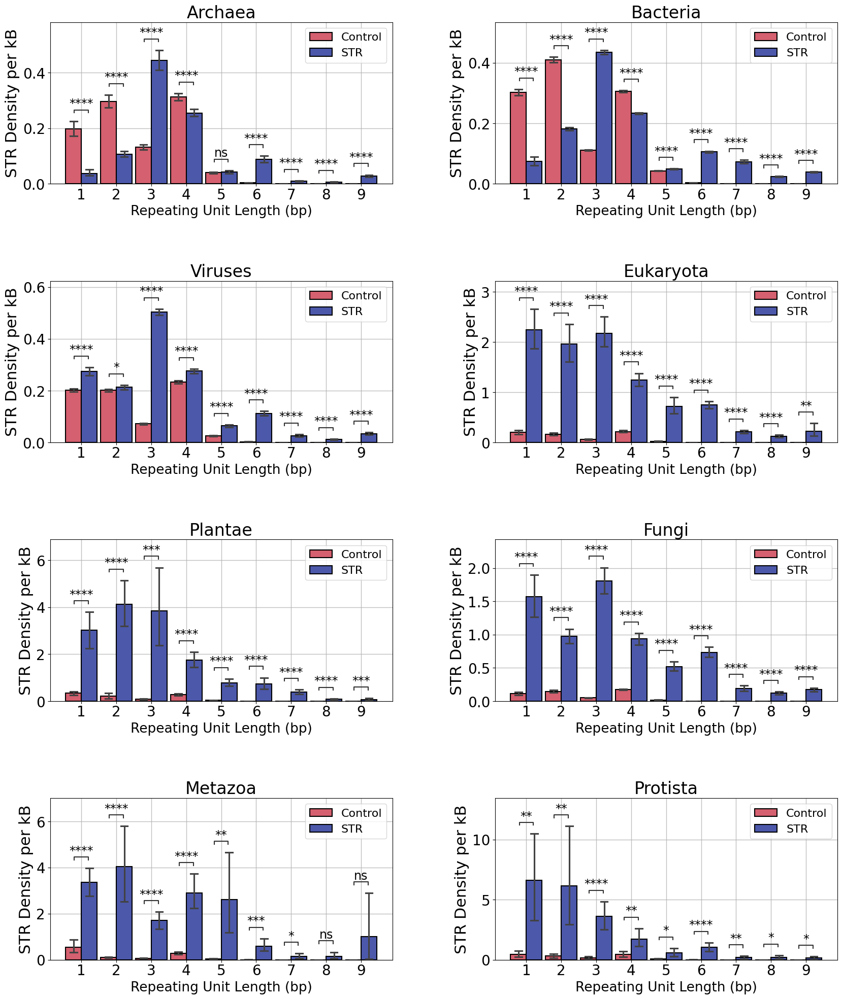

In [66]:
from statannotations.Annotator import Annotator

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 24))
axes = axes.flatten()
fig.subplots_adjust(hspace=0.6, wspace=0.3)
expected_color = "#e84d60"
observed_color = "#3c4cba"
palette = {
           "Control": expected_color,
           "STR": observed_color
          }

combinations = [("Archaea", "domain"),
                ("Bacteria", "domain"),
                ("Viruses", "domain"),
                ("Eukaryota", "domain"),
                ("Plantae", "kingdom"),
                ("Fungi", "kingdom"),
                ("Metazoa", "kingdom"),
                ("Protista", "kingdom"),
                ]
for i, combination in enumerate(combinations):
    ax = axes[i]
    kingdom, ranking = combination 
    sns.barplot(data=comparison_df_melted.filter(pl.col(ranking) == kingdom).to_pandas(),
                x="partition",
                y="value",
                hue="STR_density",
                # showfliers=False,
                palette=palette,
                width=0.9,
                linewidth=1.5,
                edgecolor="black",
                order=list(range(1, 10, 1)),
                hue_order=["Control", "STR"],
                ax=ax,
                    # boxprops=dict(linewidth=2, edgecolor='black'),
                    # medianprops=dict(color='crimson', linewidth=3), 
                    # whiskerprops=dict(linewidth=2, color='gray'),
                    # capprops=dict(linewidth=2, color='black'),
                # saturation=0.8,
                    capsize=0.4,
                    # flierprops=dict(marker='o', color='orange', markersize=5)
               )
    ax.grid(lw=1.0, alpha=0.8, zorder=0)
    ax.set_axisbelow(True)
    ax.tick_params(axis="x", rotation=0, pad=2)
    ax.set_xlabel('Repeating Unit Length (bp)')
    ax.xaxis.label.set_size(19)
    ax.set_ylabel("STR Density per kB")
    ax.yaxis.label.set_size(22)
    ax.tick_params(axis="both", 
                   labelsize=20, 
                   zorder=0)
    # ax.legend(handles=[], frameon=False)
    ax.legend(frameon=True, fancybox=True, prop={"size": 16}, title="")
    pairs=[((q, "Control"), (q, "STR")) for q in range(1, 10, 1)]

    ax.set_title(kingdom, fontsize=24)
    annotator = Annotator(ax, 
                          pairs, 
                          data=comparison_df_melted.filter(pl.col(ranking) == kingdom).to_pandas(), 
                          x="partition", 
                          hue="STR_density",
                          y="value", 
                          order=list(range(1, 10, 1))
                         )
    annotator.configure(test='t-test_ind',
                        comparisons_correction="fdr_bh",
                        text_format='star',
                        fontsize=17,
                        text_offset=-0.05,
                        loc='inside')
    annotator.apply_and_annotate()
    # for tick in ax.get_xticklabels():
    #    tick.set_ha('right')
    #    tick.set_x(tick.get_position()[0] - 0.006) 

    # x0, x1 = ax.get_xlim()
    # ax.set_xlim(x0 + 0.6, x1 - 0.6) 
fig.savefig(f"{target}/STR_density_kingdom_vs_controls_sru_comparison.pdf", transparent=True, pad_inches=0, bbox_inches="tight")
fig.savefig(f"{target}/STR_density_kingdom_vs_controls_sru_comparison.png", transparent=True, dpi=300, pad_inches=0, bbox_inches="tight")

## Phylum Level Comparisons

In [118]:
comparison_df.head()

#assembly_accession,partition,species_taxid,organism_name,gc_percent,domain,phylum,kingdom,density_STR,density_STR_control,fold_enrichment
str,str,i64,str,f64,str,str,str,f64,f64,f64
"""GCA_000146305.1""",""".""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",2.349,0.779,0.501918
"""GCA_000146305.1""","""1""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.003,0.027,-0.8
"""GCA_000146305.1""","""2""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.334,0.434,-0.130208
"""GCA_000146305.1""","""3""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",1.354,0.064,0.909732
"""GCA_000146305.1""","""4""",636,"""Edwardsiella tarda FL6-60""",59.5,"""Bacteria""","""Pseudomonadota""","""Pseudomonadati""",0.116,0.225,-0.319648


In [140]:
from scipy.stats import ttest_ind
from collections import defaultdict 
from tqdm import tqdm
from pathlib import Path
from collections import defaultdict
import numpy as np
from statsmodels.stats.multitest import multipletests

# Parameters
mode = "STR"
partition_col = "partition"
stats = defaultdict(list)
phylums = comparison_df["phylum"]
N_iterations = 1000 
partition = range(1, 10, 1)

def assign_stars(pval: float) -> str:
    if pval < 0.0001:
        return "****"
    elif pval < 0.001:
        return "***"
    elif pval < 0.01:
        return "**"
    elif pval < 0.05:
        return "*"
    else:
        return "ns"

for phylum in tqdm(phylums.unique(), desc="Processing phylums", total=phylums.n_unique()):
    df = comparison_df.filter(pl.col("phylum") == phylum).with_columns(partition_col=pl.col(partition_col).cast(pl.Utf8))
    for partitioning_element in partition:
        df_sru = df.filter(pl.col(partition_col) == str(partitioning_element))
        STR_densities = list(df_sru.select([f"density_{mode}"])[f"density_{mode}"])
        STR_densities_controls = list(df_sru.select([f"density_{mode}_control"])[f"density_{mode}_control"])
        group_A = STR_densities
        group_B = STR_densities_controls
        if len(group_A) < 2 or len(group_B) < 2:
            continue
        group = group_A + group_B
        observed_diff = np.mean(group_A) - np.mean(group_B)
        mean_values = []
        # permutations test 
        group_array = np.array(group)
        mean_values = [
            np.mean(np.random.permutation(group_array)[:len(group_A)]) -
            np.mean(np.random.permutation(group_array)[len(group_A):])
                for _ in range(N_iterations)
        ]
        # for _ in range(N_iterations):
        #    np.random.shuffle(group)
        #    group_A_perm = group[:len(group_A)]
        #    group_B_perm = group[len(group_A):]
        #    mean_values.append(np.mean(group_A_perm) - np.mean(group_B_perm))
        pvalue_permutation = np.sum(np.abs(mean_values) >= np.abs(observed_diff)) / N_iterations

        stats["phylum"].append(phylum)
        stats[partition_col].append(partitioning_element)
        stats["counts"].append(df_sru.shape[0])
        stats["enrichment"].append(
            df_sru.select(pl.col("fold_enrichment")).to_numpy().mean()
        )
        stats["pval_permutation"].append(pvalue_permutation)
        stats[f"density_{mode}"].append(
            df_sru.select(pl.col(f"density_{mode}")).to_numpy().mean()
        )
        stats[f"density_{mode}_control"].append(
            df_sru.select(pl.col(f"density_{mode}_control")).to_numpy().mean()
        )
        stats["pval"].append(
            ttest_ind(STR_densities, STR_densities_controls, equal_var=False).pvalue
        )

stats_df = pl.DataFrame(stats)
# FDR correction
rejected, pvals_corrected, _, _ = multipletests(stats_df["pval"].to_numpy(), method='fdr_bh')
rejected, pvals_corrected_permutation, _, _ = multipletests(stats_df["pval_permutation"].to_numpy(), method='fdr_bh')

# Calculate Stars

Processing phylums:  19%|█▊        | 24/129 [00:14<00:17,  6.14it/s]/home/dollzeta/micromamba/envs/biolab/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
Processing phylums:  86%|████████▌ | 111/129 [00:46<00:01,  9.31it/s]/tmp/ipykernel_31993/1610609404.py:30: UserWarning: Comparisons with None always result in null. Consider using `.is_null()` or `.is_not_null()`.
  df = comparison_df.filter(pl.col("phylum") == phylum).with_columns(partition_col=pl.col(partition_col).cast(pl.Utf8))
Processing phylums: 100%|██████████| 129/129 [00:50<00:00,  2.55it/s]


In [141]:
stats_df = stats_df.with_columns(pval_fdr_permutation=pl.Series(pvals_corrected_permutation))
stats_df

phylum,partition,counts,enrichment,pval_permutation,density_STR,density_STR_control,pval,pval_fdr_permutation
str,i64,i64,f64,f64,f64,f64,f64,f64
"""Fusobacteriota""",1,124,-0.861383,0.0,0.078016,1.327435,1.1387e-57,0.0
"""Fusobacteriota""",2,124,0.078406,0.0,0.194516,0.162669,0.004529,0.0
"""Fusobacteriota""",3,124,0.350607,0.0,0.294911,0.145387,1.0449e-50,0.0
"""Fusobacteriota""",4,124,-0.284481,0.0,0.305097,0.55525,3.9175e-41,0.0
"""Fusobacteriota""",5,124,-0.079689,0.004,0.075895,0.086556,0.042477,0.007284
…,…,…,…,…,…,…,…,…
"""Chlorobiota""",5,17,0.185513,0.17,0.035,0.024588,0.333473,0.225382
"""Chlorobiota""",6,17,0.736168,0.0,0.035235,0.002176,0.038736,0.0
"""Chlorobiota""",7,17,0.869097,0.0,0.333,0.000471,0.029098,0.0


In [142]:
pl.Series(pvals_corrected_permutation)

""
f64
0.0
0.0
0.0
0.0
0.007284
…
0.225382
0.0
0.0


In [143]:
stats_df = stats_df.with_columns(
    pl.col("pval_fdr_permutation").map_elements(assign_stars, return_dtype=pl.Utf8).alias("pval_permutation_fdr_stars")
)
# stats_df = stats_df.sort("phylum").sort("partition")
stats_df

phylum,partition,counts,enrichment,pval_permutation,density_STR,density_STR_control,pval,pval_fdr_permutation,pval_permutation_fdr_stars
str,i64,i64,f64,f64,f64,f64,f64,f64,str
"""Fusobacteriota""",1,124,-0.861383,0.0,0.078016,1.327435,1.1387e-57,0.0,"""****"""
"""Fusobacteriota""",2,124,0.078406,0.0,0.194516,0.162669,0.004529,0.0,"""****"""
"""Fusobacteriota""",3,124,0.350607,0.0,0.294911,0.145387,1.0449e-50,0.0,"""****"""
"""Fusobacteriota""",4,124,-0.284481,0.0,0.305097,0.55525,3.9175e-41,0.0,"""****"""
"""Fusobacteriota""",5,124,-0.079689,0.004,0.075895,0.086556,0.042477,0.007284,"""**"""
…,…,…,…,…,…,…,…,…,…
"""Chlorobiota""",5,17,0.185513,0.17,0.035,0.024588,0.333473,0.225382,"""ns"""
"""Chlorobiota""",6,17,0.736168,0.0,0.035235,0.002176,0.038736,0.0,"""****"""
"""Chlorobiota""",7,17,0.869097,0.0,0.333,0.000471,0.029098,0.0,"""****"""


In [144]:
stats_df["pval_permutation_fdr_stars"].value_counts()

pval_permutation_fdr_stars,count
str,u32
"""****""",477
"""**""",42
"""*""",28
"""ns""",389


In [197]:
MIN_COUNT_THRESHOLD = 10
comparison_df_avg = comparison_df.filter(~pl.col("phylum").is_null())\
                    .group_by(["species_taxid", "partition"])\
                    .agg(
                        pl.col(f"density_{pattern}").mean().alias(f"density_{pattern}"),
                        pl.col(f"density_{pattern}_control").mean().alias(f"density_{pattern}_control"),
                        pl.col("domain").first().alias("domain"),
                        pl.col("kingdom").first().alias("kingdom"),
                        pl.col("phylum").first().alias("phylum"),
                        pl.col("fold_enrichment").mean().alias("fold_enrichment"),
                    ).group_by(["partition", "phylum"])\
    .agg(
         pl.col(f"density_{pattern}").mean().alias(f"density_{pattern}"),
         pl.col(f"density_{pattern}_control").mean().alias(f"density_{pattern}_control"),
         pl.col("domain").first().alias("domain"),
         pl.col("kingdom").first().alias("kingdom"),
         pl.col("fold_enrichment").mean().alias("fold_enrichment"),
         pl.col("fold_enrichment").count().alias("counts"),
         )\
        .filter(pl.col("counts") >= MIN_COUNT_THRESHOLD)\
        .sort(f"density_{pattern}", descending=True)\
        .pivot(
            index="phylum",
            on="partition",
            values="fold_enrichment",
            aggregate_function="mean"
        ).select(["phylum"] + [str(partition) for partition in range(1, 10, 1)])
comparison_df_avg

phylum,1,2,3,4,5,6,7,8,9
str,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""Apicomplexa""",0.324562,0.616058,0.714479,0.226892,0.411638,0.920446,0.980916,0.993428,0.8
"""Chordata""",0.88759,0.942175,0.898506,0.838525,0.969857,0.987732,0.993872,0.996859,1.0
"""Streptophyta""",0.760706,0.948105,0.927486,0.710003,0.914057,0.986164,0.999504,1.0,1.0
"""Ascomycota""",0.807689,0.723003,0.929359,0.620026,0.890664,0.990836,0.993453,0.993397,1.0
"""Peploviricota""",0.468976,0.431723,0.748872,0.313063,0.305422,0.669232,0.246274,0.168007,0.425904
…,…,…,…,…,…,…,…,…,…
"""Nitrospirota""",-0.6926,0.075965,0.511229,-0.01524,0.005624,0.741359,0.425588,0.075,0.3075
"""Candidatus Saccharimonadota""",-0.909088,-0.192059,0.557009,0.022558,0.220312,0.520632,0.160173,0.059885,0.332468
"""Thermoproteota""",-0.630899,-0.28607,0.410955,-0.173366,0.063955,0.622293,0.100579,0.013889,0.049537


In [198]:
target

PosixPath('/home/dollzeta/biolab/STR_RTR/notebooks/STR_figures/simulation')

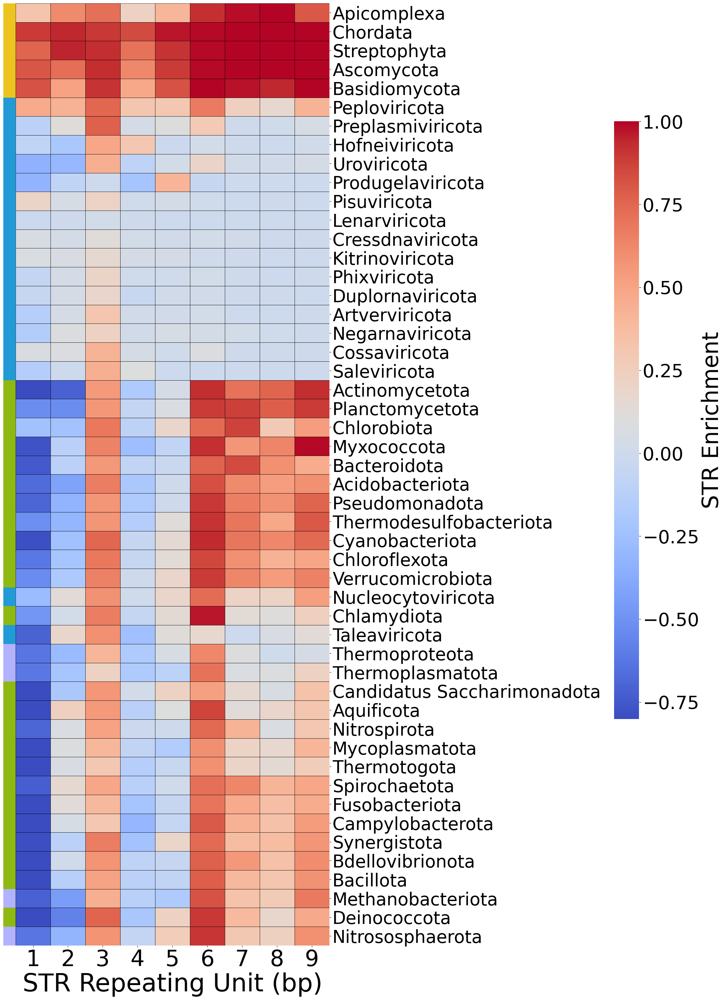

In [207]:
import matplotlib.patches as patches
kws = dict(cbar_kws=dict(location="top", shrink=0.2))
figsize=(15, 36)
kingdom_color_palette = {
                'Viruses': '#229ad6',
                "Bacteria": "#0fbf2d",
                "Archaea": "#b2b2ff",
                "Fungi": "#4d325e",
                "Plantae": "#b50996",
                "Eubacteria": "#0fbf2d",
                "Metazoa": "#9bba2d",
                "Protista": "#c78f5b",
                "Archaeabacteria": "#7b7bed",
                } 
domain_colors = {
                'Eukaryota': '#edc41f',
                'Archaea': '#b2b2ff',
                'Bacteria': '#b2d8b2',
                'Viruses': '#229ad6',
}
domain_colors.update({"Bacteria": "#8eb812"})
kingdom_color_palette.update({"Bacteria": "#8eb812"})

# kingdom_to_domain = dict(zip(comparison_df["kingdom"], comparison_df["domain"]))
phylum_to_domain = dict(zip(comparison_df["phylum"], comparison_df["domain"]))
phylum_to_kingdom= dict(zip(comparison_df["phylum"], comparison_df["kingdom"]))
# phylum_to_kingdom = {phylum: kingdom if kingdom_to_domain[kingdom] != "Viruses" else "Viruses" for phylum, kingdom in phylum_to_kingdom.items()}
domains = list(comparison_df_avg.with_columns(pl.col("phylum").replace_strict(phylum_to_domain).alias("domain"))["domain"])
# kingdoms = list(comparison_df_avg.with_columns(pl.col("phylum").replace_strict(phylum_to_kingdom).alias("kingdom"))["kingdom"])
domain_colors = [domain_colors[domain] for domain in domains]
# kingdom_colors = [kingdom_color_palette[kingdom] for kingdom in kingdoms]
cg = sns.clustermap(
                  comparison_df_avg.to_pandas().set_index("phylum"),
                   row_colors=[domain_colors], # kingdom_colors],
                   row_cluster=True, 
                   col_cluster=False,
                    method="ward",
                    vmax=1.0,
                    cmap="coolwarm",
                   figsize=figsize,
                   robust=True,
                   yticklabels=True, 
                   xticklabels=True,
                   cbar_kws={"shrink": 0.1, 
                             "orientation": "vertical"}
                   )
ax = cg.ax_heatmap
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
ax = cg.ax_heatmap
ax.set_ylabel("")
t = ax.xaxis.get_majorticklocs()
ax.xaxis.label.set_size(52)
ax.yaxis.label.set_size(30)
ax.tick_params(axis="both", 
               which="major", 
               labelsize=38,
               rotation=0
              )
ax.tick_params(axis="x", 
               which="major", 
               labelsize=48,
               rotation=0
              )

x0, _y0, _w, _h = cg.cbar_pos
cg.ax_cbar.set_position([1.4, 0.2, 0.05, 0.5])
cg.ax_cbar.tick_params(axis='both', length=4, labelsize=40)
cg.cax.set_ylabel(f'{mode} Enrichment', size=48) #, labelpad=15, size=12)
for spine in cg.ax_cbar.spines:
    cg.ax_cbar.spines[spine].set_color('black')
    # cg.ax_cbar.spines[spine].set_linewidth(2)

ax.set_xlabel("STR Repeating Unit (bp)", size=54)
data = comparison_df_avg.to_pandas().loc[cg.dendrogram_row.reordered_ind]
n_rows, n_cols = data.shape
for i in range(n_rows):
    for j in range(n_cols):
        rect = patches.Rectangle((j, i), 1, 1, linewidth=0.5, edgecolor='black', facecolor='none')
        ax.add_patch(rect)

fig = plt.gcf()
fig.savefig(target.joinpath(f"STR_clustermap_enrichment_simie_phylum.pdf"), 
            transparent=True,
            bbox_inches='tight', 
            dpi=600)
plt.show()
